<a href="https://colab.research.google.com/github/bowu1999/CS-Notes/blob/master/geo_data_clip.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!ls drive/MyDrive/

In [ ]:
tif_file = "drive/MyDrive/4shp裁剪.tif"
dem_file = "drive/MyDrive/深圳DEM_ProjectRaster1.tif"
txt_path = "drive/MyDrive/地质灾害点.txt"

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from functools import wraps
from typing import List
import cv2

def show_img(img) -> None:
    try:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    except:
        img = cv2.convertScaleAbs(img)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure("Image")
    plt.imshow(img)
    plt.axis('on')
    plt.title("image")
    plt.show()

def prt(var):
    (name, value) = var
    print(f"Variable name: {name}, Value: {value}")

In [ ]:
file_path = "drive/MyDrive/地层向量化/dzt-full-size.jpg"
img = cv2.imread(file_path)

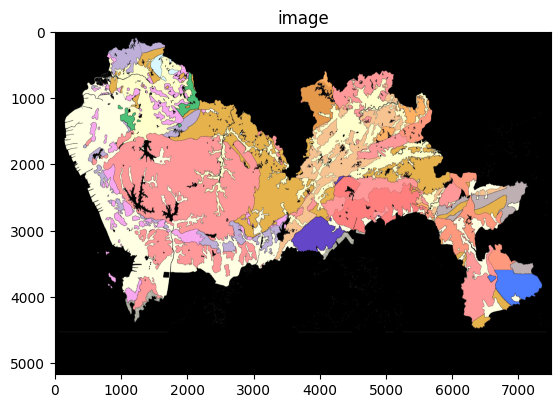

In [ ]:
show_img(img)

# 裁剪遥感图像

In [ ]:
import numpy as np
from osgeo import gdal, osr
remote_sensing_image = gdal.Open(tif_file)
dem = gdal.Open(dem_file)
import cv2
import copy

In [ ]:
data = remote_sensing_image
# 波段数
prt(("data.RasterCount", data.RasterCount))
# 六个参数，分别代表左上角x坐标；东西方向上图像的分辨率；如果北边朝上，地图的旋转角度，0表示图像的行与x轴平行；左上角y坐标；
# 如果北边朝上，地图的旋转角度，0表示图像的列与y轴平行；南北方向上地图的分辨率。
prt(("data.GetGeoTransform()", data.GetGeoTransform()))
# 栅格数据的列数/
prt(("data.RasterXSize", data.RasterXSize))
# 栅格数据的行数
prt(("data.RasterYSize", data.RasterYSize))
# 地图投影信息
prt(("data.GetProjection()", data.GetProjection()))

Variable name: data.RasterCount, Value: 4
Variable name: data.GetGeoTransform(), Value: (113.75143448, 0.0001171000000000012, 0.0, 22.86179216, 0.0, -9.005999999999978e-05)
Variable name: data.RasterXSize, Value: 7490
Variable name: data.RasterYSize, Value: 5169
Variable name: data.GetProjection(), Value: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]


In [ ]:
data = dem
 # 波段数
prt(("data.RasterCount", data.RasterCount))
# 六个参数，分别代表左上角x坐标；东西方向上图像的分辨率；如果北边朝上，地图的旋转角度，0表示图像的行与x轴平行；左上角y坐标；
# 如果北边朝上，地图的旋转角度，0表示图像的列与y轴平行；南北方向上地图的分辨率。
prt(("data.GetGeoTransform()", data.GetGeoTransform()))
# 栅格数据的列数
prt(("data.RasterXSize", data.RasterXSize))
# 栅格数据的行数
prt(("data.RasterYSize", data.RasterYSize))
# 地图投影信息
prt(("data.GetProjection()", data.GetProjection()))

Variable name: data.RasterCount, Value: 1
Variable name: data.GetGeoTransform(), Value: (113.74049174360867, 0.00011959122953038697, 0.0, 22.877213338873677, 0.0, -0.00011959122953038667)
Variable name: data.RasterXSize, Value: 7492
Variable name: data.RasterYSize, Value: 4149
Variable name: data.GetProjection(), Value: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]


In [ ]:
data = remote_sensing_image
tif_band2 = data.GetRasterBand(1)
tif_band3 = data.GetRasterBand(2)
tif_band4 = data.GetRasterBand(3)
tif_band8 = data.GetRasterBand(4)
tif_array2 = tif_band2.ReadAsArray()
tif_array3 = tif_band3.ReadAsArray()
tif_array4 = tif_band4.ReadAsArray()
tif_array8 = tif_band8.ReadAsArray()
tif_array2[tif_array2 > 4300] = 0
tif_array3[tif_array3 > 4300] = 0
tif_array4[tif_array4 > 4300] = 0
tif_array8[tif_array8 > 4300] = 0

In [ ]:
data = dem
dem_band = data.GetRasterBand(1)
dem_array = dem_band.ReadAsArray()
dem_array[dem_array == 32767] = 0
img_dem_array = dem_array.copy()
img_dem_array[img_dem_array == 0] = 255
img_dem_array += abs(img_dem_array.min())
img_dem_array[img_dem_array > 255] = 255

In [ ]:
# img_single_band[4700:, 4000:] = np.full(img_single_band[4700:, 4000:].shape, 255)
dem_array[4700:, 4000:]

array([], shape=(0, 3492), dtype=int16)

In [ ]:
# 归一化处理
normalized_tif_band2 = (tif_array2 - tif_array2.min()) / (tif_array2.max() - tif_array2.min()) * 255
normalized_tif_band2 = normalized_tif_band2.astype('uint8')
normalized_tif_band3 = (tif_array3 - tif_array3.min()) / (tif_array3.max() - tif_array3.min()) * 255
normalized_tif_band3 = normalized_tif_band3.astype('uint8')
normalized_tif_band4 = (tif_array4 - tif_array4.min()) / (tif_array4.max() - tif_array4.min()) * 255
normalized_tif_band4 = normalized_tif_band4.astype('uint8')
normalized_tif_band8 = (tif_array8 - tif_array8.min()) / (tif_array8.max() - tif_array8.min()) * 255
normalized_tif_band8 = normalized_tif_band8.astype('uint8')
normalized_dem_band = (dem_array - dem_array.min()) / (dem_array.max() - dem_array.min()) * 255
normalized_dem_band = normalized_dem_band.astype('uint8')
img_normalized_dem_band = (img_dem_array - img_dem_array.min()) / (img_dem_array.max() - img_dem_array.min()) * 255
img_normalized_dem_band = img_normalized_dem_band.astype('uint8')

In [ ]:
normalized_dem_band = cv2.resize(normalized_dem_band, (7490, 5169))
normalized_dem_band[4700:, 4000:] = np.full(normalized_dem_band[4700:, 4000:].shape, 0)
normalized_dem_band[normalized_dem_band == 24] = 0
normalized_dem_band

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

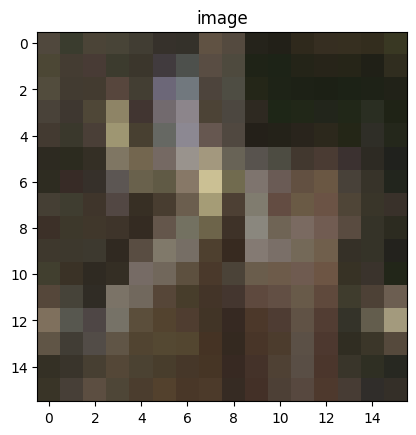

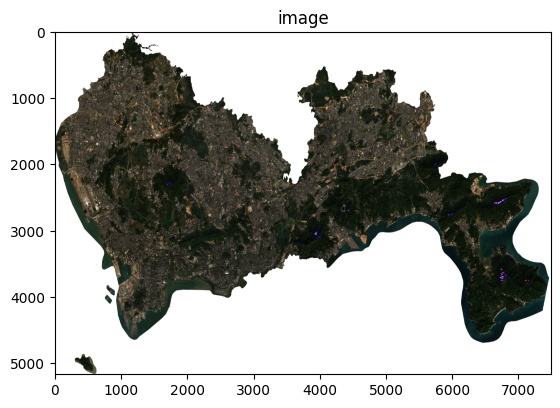

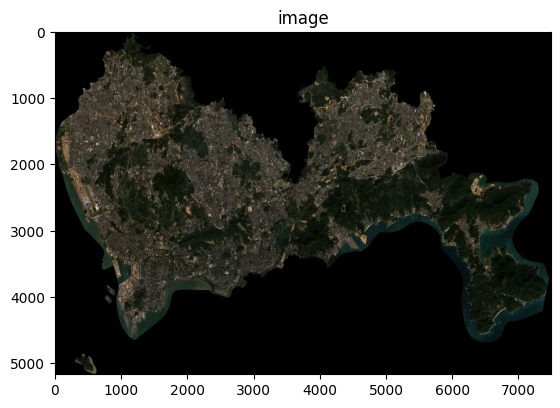

In [ ]:
# 可视化可见光波段
img_normalized_tif_band2 = copy.deepcopy(normalized_tif_band2)
img_normalized_tif_band3 = copy.deepcopy(normalized_tif_band3)
img_normalized_tif_band4 = copy.deepcopy(normalized_tif_band4)
img_normalized_tif_band2[img_normalized_tif_band2 == 0] = 255
img_normalized_tif_band3[img_normalized_tif_band3 == 0] = 255
img_normalized_tif_band4[img_normalized_tif_band4 == 0] = 255
test_img = cv2.merge([img_normalized_tif_band2[1000:1016, 1000:1016], img_normalized_tif_band3[1000:1016, 1000:1016], img_normalized_tif_band4[1000:1016, 1000:1016]])
test_white_img_entirety = cv2.merge([img_normalized_tif_band2, img_normalized_tif_band3, img_normalized_tif_band4])
test_black_img_entirety = cv2.merge([normalized_tif_band2, normalized_tif_band3, normalized_tif_band4])
show_img(test_img)
show_img(test_white_img_entirety)
show_img(test_black_img_entirety)

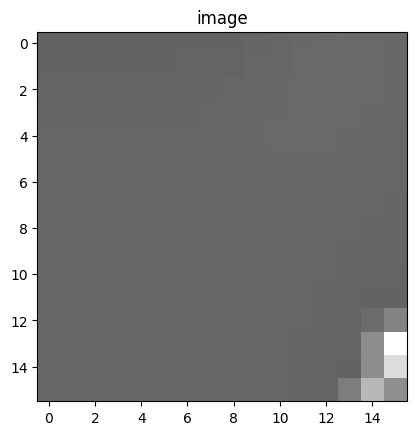

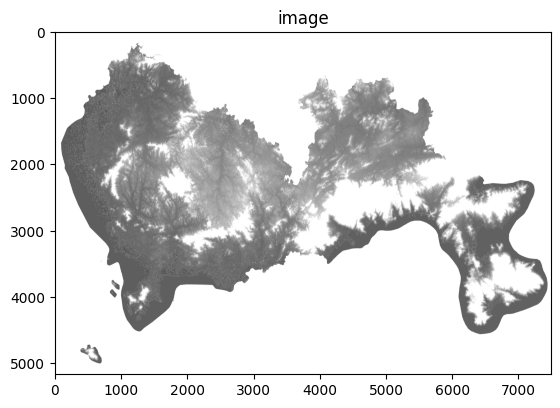

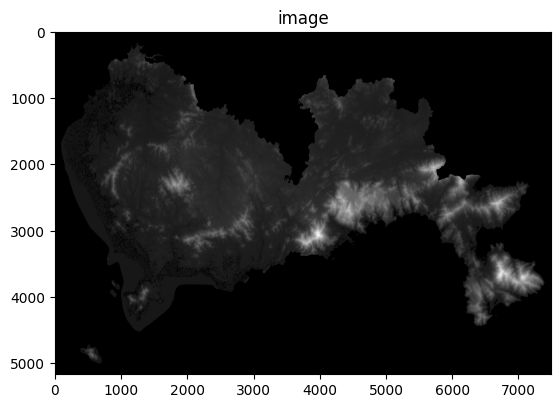

In [ ]:
# 可视化dem
img_normalized_dem_band = cv2.resize(img_normalized_dem_band, (7490, 5169))
img_test_dem_local = cv2.merge([img_normalized_dem_band[1000:1016, 1000:1016], img_normalized_dem_band[1000:1016, 1000:1016], img_normalized_dem_band[1000:1016, 1000:1016]])
show_img(img_test_dem_local)
img_single_band = copy.deepcopy(img_normalized_dem_band)
img_single_band[4700:, 4000:] = np.full(img_single_band[4700:, 4000:].shape, 255)
img_test_dem_entirety = cv2.merge([img_single_band, img_single_band, img_single_band])
img_black_dem_entirety = cv2.merge([normalized_dem_band, normalized_dem_band, normalized_dem_band])
show_img(img_test_dem_entirety)
show_img(img_black_dem_entirety)

(7490, 7490)


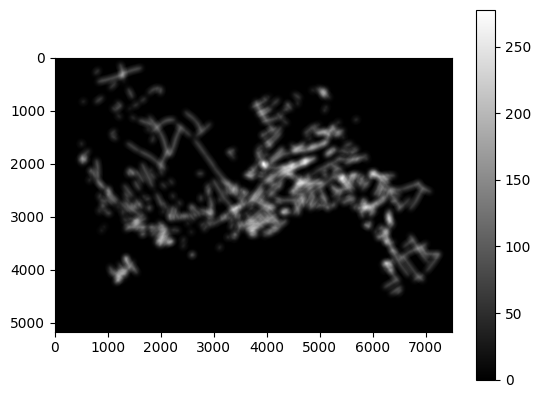

In [ ]:
fracture_influence = np.loadtxt("drive/MyDrive/地层向量化/断裂影响强度数据.txt")
print(fracture_influence.shape)
plt.imshow(fracture_influence[1161:6330, :], cmap='gray')
plt.colorbar()
plt.show()

In [ ]:
fracture_influence_image = fracture_influence[1161:6330, :]
# 所有波段叠加
raw_data = np.dstack((normalized_tif_band2, normalized_tif_band3, normalized_tif_band4, normalized_tif_band8, normalized_dem_band, fracture_influence_image))
raw_data.shape

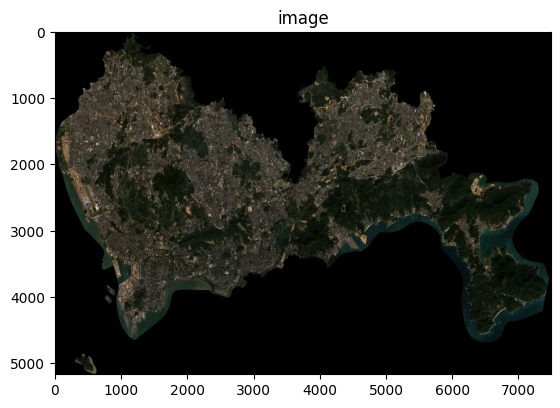

In [ ]:
show_img(raw_data[:, :, :3].astype('int'))

# 深圳市shp处理

In [ ]:
import numpy as np
import cv2
from osgeo import ogr

X = 7490
Y = 5169
x_resolution = .1171000000000012
y_resolution = -.09005999999999978
x_start = 113.75143448
y_start = 22.86179216
sz_shp_file = "drive/MyDrive/深圳市/深圳市.shp"

In [ ]:
# 打开 Shapefile 文件
shapefile = ogr.Open(sz_shp_file)

# 获取第一个图层（Layer）
layer = shapefile.GetLayer(0)
polygons = []

# 遍历图层中的要素（Features）
for i, feature in enumerate(layer):
    # 获取要素的几何对象
    geometry = feature.GetGeometryRef()
    polygon = []
    # 确保几何对象是一个多边形
    if geometry.GetGeometryType() == ogr.wkbPolygon:
        # 获取多边形的环（Ring）
        ring = geometry.GetGeometryRef(0)
        # 获取环中的点坐标
        for i in range(ring.GetPointCount()):
            point = ring.GetPoint(i)
            x, y = int(1000*(point[0] - x_start)/x_resolution), int(1000*(point[1] - y_start)/y_resolution)
            polygon.append([x, y])
    elif geometry.GetGeometryType() == ogr.wkbMultiPolygon:
        # 获取多边形的数量
        polygon_count = geometry.GetGeometryCount()
        # 遍历每个多边形
        for j in range(polygon_count):
            poly = geometry.GetGeometryRef(j)
            # 获取多边形的环（Ring）
            ring = poly.GetGeometryRef(0)
            # 获取环中的点坐标
            for k in range(ring.GetPointCount()):
                point = ring.GetPoint(k)
                x, y = int(1000*(point[0] - x_start)/x_resolution), int(1000*(point[1] - y_start)/y_resolution)
                polygon.append([x, y])
    polygons.append(polygon)

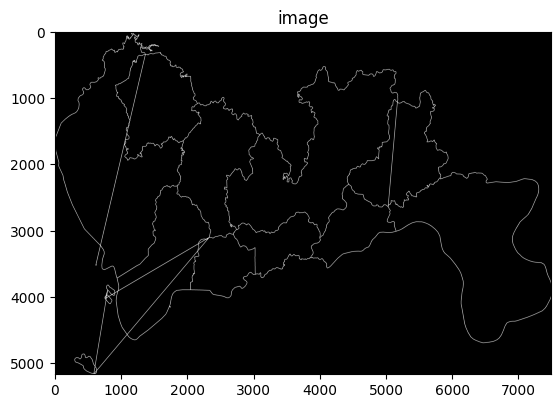

In [ ]:
image = np.zeros((Y, X, 3), dtype=np.uint8)
for polygon in polygons:
  points = np.array(polygon)
  cv2.polylines(image, [points], isClosed=True, color=(255, 255, 255), thickness=6)
show_img(image)

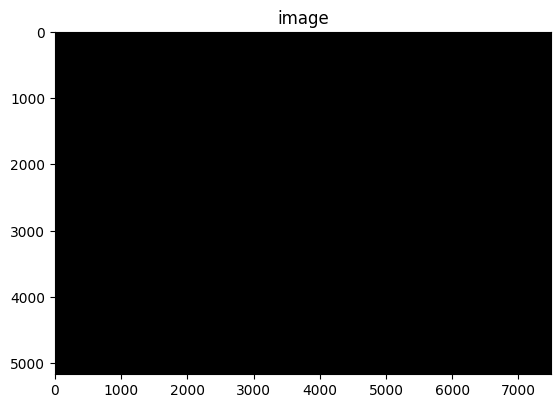

In [ ]:
points = np.array(polygons[:-63])
image = np.zeros((Y, X, 3), dtype=np.uint8)
cv2.polylines(image, [points], isClosed=True, color=(255, 255, 255), thickness=6)
show_img(image)

In [ ]:
sz_area = ["南山区1", "南山区2", "南山区3", "南山区", "罗湖区", "福田区", "宝安区", "龙岗区1", "龙岗区2", "盐田区", "龙华区", "坪山区", "光明区"]
sz_shp_polygons = [polygons[2][-24:-9], polygons[2][-9:], polygons[2][-63:-24], polygons[2][:-63], polygons[0], polygons[1], polygons[3][:-4], polygons[4][:566], polygons[4][566:], polygons[5], polygons[6], polygons[7], polygons[8]]

In [ ]:
sz_area_dict = {name: value for name, value in zip(sz_area, sz_shp_polygons)}

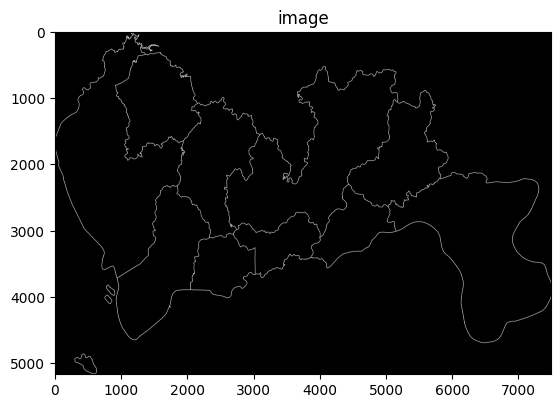

In [ ]:
image = np.zeros((Y, X, 3), dtype=np.uint8)
for polygon in sz_shp_polygons:
  points = np.array(polygon)
  cv2.polylines(image, [points], isClosed=True, color=(255, 255, 255), thickness=6)
show_img(image)

In [ ]:
import json

# 指定要保存的 JSON 文件路径
file_path = "drive/MyDrive/深圳市.json"

# 将字典保存到 JSON 文件
with open(file_path, "w") as json_file:
    json.dump(sz_area_dict, json_file)

In [ ]:
from shapely.geometry import Polygon


sz_polygon = Polygon(sz_shp_polygons[3])
for plg in sz_shp_polygons[4:]:
  sz_polygon = sz_polygon.union(Polygon(plg))

In [ ]:
sz_points = list(sz_polygon.exterior.coords)
sz_points = [[int(i[0]), int(i[1])] for i in sz_points]

In [ ]:
import json

data = dict(
    polygon = sz_points
)
# 指定要保存的 JSON 文件路径
file_path = "drive/MyDrive/sz_points.json"

# 将字典保存到 JSON 文件
with open(file_path, "w") as json_file:
    json.dump(data, json_file)

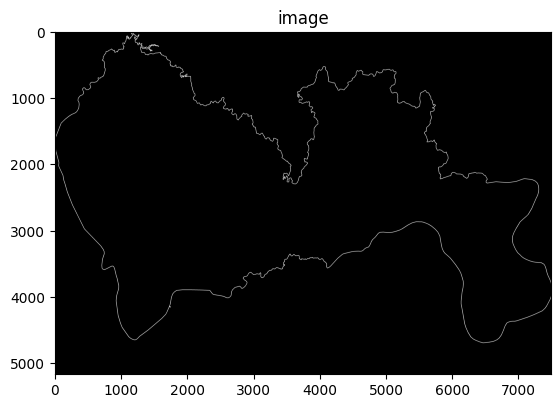

In [ ]:
image = np.zeros((Y, X, 3), dtype=np.uint8)
points = np.array(sz_points)
cv2.polylines(image, [points], isClosed=True, color=(255, 255, 255), thickness=6)
show_img(image)

# 样本裁剪

## 读取深圳区域

In [ ]:
file_path = "drive/MyDrive/sz_points.json"
import json

# 打开 JSON 文件
with open(file_path, "r") as file:
    # 读取文件内容
    json_data = file.read()

    # 解析 JSON 数据
    data = json.loads(json_data)

sz_points = data['polygon']

## 裁剪

In [ ]:
from shapely.geometry import Point, Polygon
import os

polygon = Polygon(sz_points)

save_root = "drive/MyDrive"
data_folder = "txt-datasets"
window_size = 48
patch_size = 16
patch_num = 3
half = window_size / 2
X = 7490
Y = 5169

folder_path = os.path.join(save_root, data_folder)
if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print("文件夹已创建")
else:
    print("文件夹已存在")
datasets = []
# sample_num = 0
for i in range(patch_size, raw_data.shape[0] - (2 * patch_size) + 1, patch_size):
  for j in range(patch_size, raw_data.shape[1] - (2 * patch_size) + 1, patch_size):
    center_y, center_x = i - patch_size + half, j - patch_size + half
    point = Point(center_x, center_y)
    if polygon.contains(point):
      em_data = raw_data[i - patch_size: i + 2 * patch_size, j - patch_size: j + 2 * patch_size]
      em_path = f"{i - patch_size}-{j - patch_size}.txt"
      print(f"saving :{em_path}")
      em_json = dict(
          coo = [int(i / 16 - 1), int(j / 16 - 1)],
          data_path = em_path,
      )
      arr_2d = em_data.reshape((-1, em_data.shape[-1]))
      np.savetxt(os.path.join(save_root, data_folder, em_path), arr_2d, fmt='%d')
    #   sample_num += 1
      # 将保存的数组还原，训练数据处理时也需要添加这一步
      # print("The picture is as follows")
    #   show_img(arr_2d.reshape(48, 48, 6)[:,:,:3].astype('int16'))
    #   show_img(arr_2d.reshape(48, 48, 6)[:,:,4])
      datasets.append(em_json)

流式输出内容被截断，只能显示最后 5000 行内容。
saving :3376-2304.txt
saving :3376-2320.txt
saving :3376-2336.txt
saving :3376-2352.txt
saving :3376-2368.txt
saving :3376-2384.txt
saving :3376-2400.txt
saving :3376-2416.txt
saving :3376-2432.txt
saving :3376-2448.txt
saving :3376-2464.txt
saving :3376-2480.txt
saving :3376-2496.txt
saving :3376-2512.txt
saving :3376-2528.txt
saving :3376-2544.txt
saving :3376-2560.txt
saving :3376-2576.txt
saving :3376-2592.txt
saving :3376-2608.txt
saving :3376-2624.txt
saving :3376-2640.txt
saving :3376-2656.txt
saving :3376-2672.txt
saving :3376-2688.txt
saving :3376-2704.txt
saving :3376-2720.txt
saving :3376-2736.txt
saving :3376-2752.txt
saving :3376-2768.txt
saving :3376-2784.txt
saving :3376-2800.txt
saving :3376-2816.txt
saving :3376-2832.txt
saving :3376-2848.txt
saving :3376-2864.txt
saving :3376-2880.txt
saving :3376-2896.txt
saving :3376-2912.txt
saving :3376-2928.txt
saving :3376-2944.txt
saving :3376-2960.txt
saving :3376-2976.txt
saving :3376-2992.txt
savin

In [ ]:
import os
import json
json_file = "json-files/data.json"
with open(os.path.join(save_root, json_file), "w") as f:
    json.dump(datasets, f)

In [ ]:
polygon = Polygon(sz_points)

In [ ]:
from shapely.geometry import Point, Polygon
point = Point(4000, 3000)
polygon.contains(point)

True

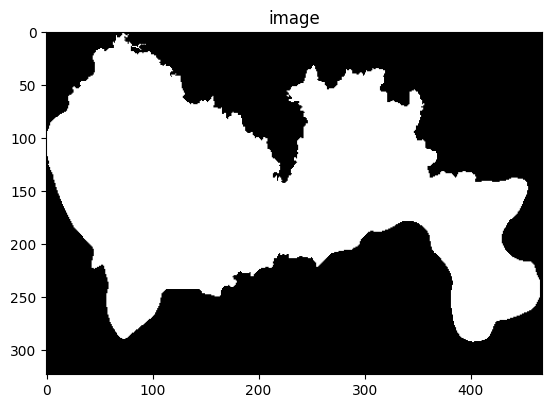

In [ ]:
# 根据数据点位置，绘制结果图
coos = []
for coo in datasets:
  coos.append(coo['coo'])
image = np.zeros((int(Y/16), int(X/16), 3), dtype=np.uint8)
for coo in coos:
  image[coo[0], coo[1]] = (255, 255, 255)
show_img(image)

In [ ]:
len(datasets)

69191

In [ ]:
69191

# 地灾点处理

In [ ]:
import os

root_path = "drive/MyDrive"
disaster_path = "地质灾害点.txt"
img_X = 7490
img_Y = 4600
x_resolution = .1171000000000012
y_resolution = -.09005999999999978
x_start = 113.75143448
y_start = 22.86179216
dzt_x_start = 83270.97
dzt_x_end = 174150.594748
dzt_y_start = 54341.89
dzt_y_end = 7801.28
dzt_X = dzt_x_end - dzt_x_start
dzt_Y = dzt_y_end - dzt_y_start
img_x_satar = 0
img_y_satar = 0
x_scale = dzt_X / img_X
y_scale = dzt_Y / img_Y

In [ ]:
with open(os.path.join(root_path, disaster_path), 'r') as f:
  lines = f.readlines()
disaster_spots_0 = []
for line in lines:
  disaster_spots_0.append([float(i) for i in line.strip().split(" ")])

In [ ]:
# 地灾坐标点转换为图像中的相对位置
disaster_spots = []
for disaster_spot in disaster_spots_0:
  disaster_spots.append([int((disaster_spot[0] - x_start) * 1000/ x_resolution), int((disaster_spot[1] - y_start) * 1000/ y_resolution)])

In [ ]:
# 根据图像相对位置确定地灾点在地质图中的位置
dzt_disaster_spots = []
for disaster_spot in disaster_spots:
  dzt_disaster_spots.append([disaster_spot[0] * x_scale, disaster_spot[1] * y_scale])

# 地层向量化处理

In [ ]:
import os

root_path = "drive/MyDrive"
disaster_path = "地质灾害点.txt"
img_X = 7490
img_Y = 4600
x_resolution = .1171000000000012
y_resolution = -.09005999999999978
x_start = 113.75143448
y_start = 22.86179216
dzt_x_start = 83270.97
dzt_x_end = 174150.594748
dzt_y_start = 54341.89
dzt_y_end = 7801.28
dzt_X = dzt_x_end - dzt_x_start
dzt_Y = dzt_y_end - dzt_y_start
img_x_satar = 0
img_y_satar = 0
x_scale = dzt_X / img_X
y_scale = dzt_Y / img_Y

In [ ]:
import json
import os

root_path = "drive/MyDrive/地层向量化"
dc_vector_path = "深圳市地层向量化.json"
dc_influence_intensity_path = "深圳市断层影响强度.json"
dc_wap_path = "深圳地层.wap"

In [ ]:
with open(os.path.join(root_path, dc_vector_path), 'r') as f:
  dc_vector = json.load(f)
with open(os.path.join(root_path, dc_influence_intensity_path), 'r') as f:
  dc_influence_intensity = json.load(f)
with open(os.path.join(root_path, dc_wap_path), 'r') as f:
  lines = f.readlines()

In [ ]:
# wap文件解析
wap = dict()
i = 0
wap["HEAD"] = lines[i].strip()

i += 1
wap["Number-of-arc-steps"] = int(lines[i].strip())
i += 1
arc_segments = []
for inx in range(wap["Number-of-arc-steps"]):
  arc_step = dict()
  i += 1
  arr = [int(e) for e in lines[i].strip().split(",")]
  arc_step["previous-node"], arc_step["back-node"] = arr[0], arr[1]
  i += 1
  arr = [int(e) for e in lines[i].strip().split(",")]
  arc_step["left-area"], arc_step["right-area"] = arr[0], arr[1]
  i += 1
  point_nums = int(lines[i].strip())
  i += 1
  points = []
  for einx in range(point_nums):
    point = [float(e) for e in lines[i].strip().split(",")]
    points.append(point)
    i += 1
  arc_step['points'] = points
  arr = lines[i].strip().split(",")
  i += 1
  arc_step["id"] = int(arr[0])
  arc_step["len"] = float(arr[1])
  arc_segments.append(arc_step)
wap['arc-segments'] = arc_segments
wap['number-of-nodes'] = int(lines[i])
i += 1
nodes = []
for einx in range(wap['number-of-nodes'] - 1):
  node = dict()
  arr = [float(e) for e in lines[i].strip().split(",")]
  node['x'], node['y'] = arr[0], arr[1]
  i += 1
  nums = int(lines[i][0])
  i += 1
  arc_number = []
  for _ in range(nums):
    arc_number.append(int(lines[i]))
    i += 1
  node['arc-number'] = arc_number
  nodes.append(node)
wap['nodes'] = nodes
area_nums = int(lines[i])
wap['area-nums'] = area_nums
i += 1
areas = []
for _ in range(area_nums):
  area = dict()
  i += 1
  arc_number = []
  nums = int(lines[i])
  i += 1
  for einx in range(nums):
    arc_number.append(int(lines[i]))
    i += 1
  area['arc-number'] = arc_number
  areas.append(area)
wap['areas'] = areas

In [ ]:
[k for k in wap]

['HEAD',
 'Number-of-arc-steps',
 'arc-segments',
 'number-of-nodes',
 'nodes',
 'area-nums',
 'areas']

In [ ]:
[k for k in wap['arc-segments'][0]]

['previous-node',
 'back-node',
 'left-area',
 'right-area',
 'points',
 'id',
 'len']

In [ ]:
dzt_area_number = set()
for arc in wap['arc-segments']:
  dzt_area_number.add(arc['left-area'])
  dzt_area_number.add(arc['right-area'])

In [ ]:
dzt_areas = dict()
for arc in wap['arc-segments']:
  if arc['left-area'] not in dzt_areas:
    dzt_areas[arc['left-area']] = [arc['points']]
  else:
    dzt_areas[arc['left-area']].append(arc['points'])
  if arc['right-area'] not in dzt_areas:
    dzt_areas[arc['right-area']] = [arc['points']]
  else:
    dzt_areas[arc['right-area']].append(arc['points'])

In [ ]:
img_area_lines = dict()
for k, v in dzt_areas.items():
  ll = []
  for e in v:
    l = [[int((o[0] - dzt_x_start)/x_scale), int((o[1] - dzt_y_start)/y_scale)] for o in e]
    ll.append(l)
  img_area_lines[k] = ll

In [ ]:
from shapely.geometry import Polygon, LineString

img_areas = dict()
for k, v in img_area_lines.items():
  # if k != 0:
  #   continue
  if len(v[0]) < 3:
    mid = [int((v[0][0][0] + v[0][1][0])/2), int((v[0][0][1] + v[0][1][1])/2)]
    v[0].append(v[0][1])
    v[0][1] = mid
  polygon = Polygon(v[0])
  for inx, e in enumerate(v[1:]):
    if len(e) < 2:
      continue
    line = LineString(e).buffer(0)
    polygon = polygon.union(line)
  img_areas[k] = polygon

In [ ]:
all_areas = dict()

for k, v in img_areas.items():
  all_areas[k] = [[int(o[0]), int(o[1])] for o in v.exterior.coords]

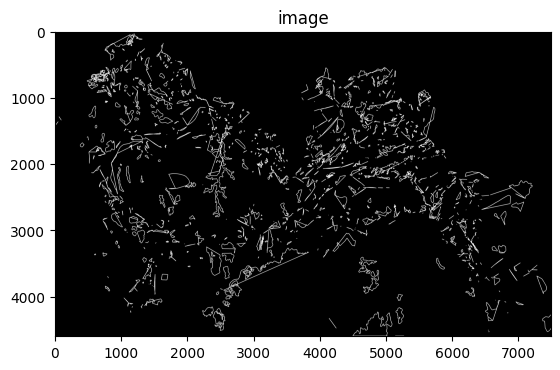

In [ ]:
import numpy as np
image = np.zeros((img_Y, img_X, 3), dtype=np.uint8)
for k, polygon in all_areas.items():
  points = np.array(polygon)
  try:
    cv2.polylines(image, [points], isClosed=True, color=(255, 255, 255), thickness=6)
  except:
    print(points)
show_img(image)

In [ ]:
[k for k in dc_vector]

['Qg',
 'Q1',
 'Qdw',
 'Qel',
 'k2E1d',
 'k2ss',
 'k1g',
 'J3k1n',
 'J2-3y',
 'J2jl',
 'J1-2t',
 'J1gy',
 'J1j',
 'T3x',
 'C1c2',
 'C1c1',
 'C1s^',
 'C1ds',
 'D3c^',
 'D2-3l',
 'Z1d',
 'K1c1',
 'K1b1',
 'J1a3',
 'J1b3',
 'J1b2',
 'J12',
 'O1']

In [ ]:
dc_vector['J1a3']['attribute']

'早侏罗系，细、中粒斑状黑云母花岗岩'

# 地质图处理地层数据

In [ ]:
import cv2
import numpy as np
import os

img_X = 7490
img_Y = 4600
root_path = "drive/MyDrive/地层向量化"
jpg_path = "dzt.JPG"
img = cv2.imread(os.path.join(root_path, jpg_path))
img = cv2.resize(img, (img_X, img_Y))

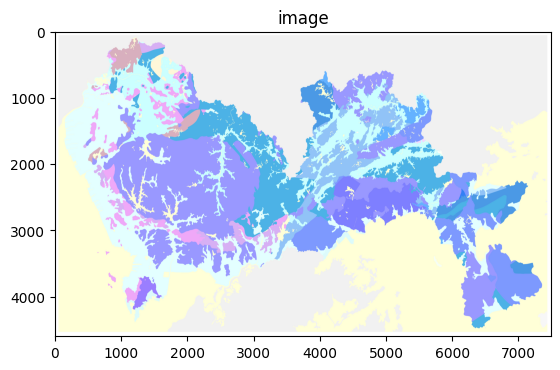

In [ ]:
show_img(img)

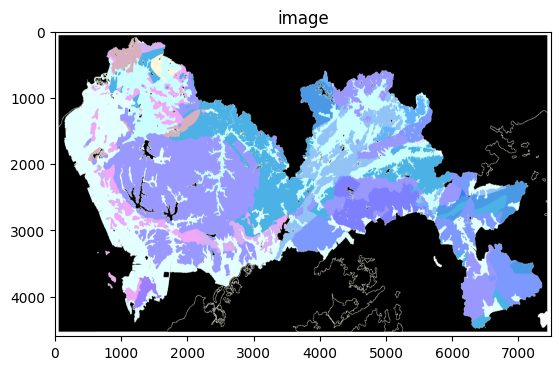

In [ ]:
image = img

# 定义要更改的颜色
old_color = [255, 255, 215]
new_color = [0, 0, 0]
# 找到要更改颜色的像素位置
indices = np.where((image == old_color).all(axis=2))

# 将颜色更改为新颜色
image[indices] = new_color
old_color = [241, 241, 241]
indices = np.where((image == old_color).all(axis=2))
image[indices] = new_color
show_img(image)

In [ ]:
test = image[500:1000, 1500:2000]
show_img(test)
test

In [ ]:
# colors = [
#     [216, 175, 190],
#     [ 76, 178, 230],
#     [239, 168, 248],
#     [227, 255, 255],
#     [153, 152, 255],
#     [154, 126, 255],
#     [145, 195, 247],
#     [ 75, 153, 229],
#     [126, 127, 255],
#     [125, 153, 254],
#     [203, 255, 255],
#     [100, 178, 255],
#     [178, 175, 190],
#     [200,  70, 100],
#     [255, 125,  76],
#     [118, 192,  76],
# ]
colors = [
    [216, 175, 190],
    [ 76, 178, 230],
    [239, 168, 248],
    [227, 255, 255],
    [153, 152, 255],
    [145, 195, 247],
    [ 75, 153, 229],
    [126, 127, 255],
    [125, 153, 254],
    [203, 255, 255],
    [100, 178, 255],
    [178, 175, 190],
    [200,  70, 100],
    [255, 125,  76],
    [118, 192,  76],
    [255, 247, 217]
]
dzt_dc = [
    [{0:{0:"Z1d"}}],
    [{0:{0:"J1-2t"}}],
    [{0:{0:"O1"}}],
    [{0:{0:"Qg"}}],
    [{0:{0:"K1b1"}}],
    [{0:{0:["C1c1", "C1c2"]}}],
    [{0:{0:"C1ds"}}],
    [{0:{0:"J1a3"}}],
    [{0:{0:"J1b3"}}],
    [{0:{0:"Qdw"}}],
    [{0:{0:"k2E1d"}}],
    [{0:{0:"D3c^"}}],
    [{0:{0:"J2-3y"}}],
    [{0:{0:"J3k1n"}}],
    [{0:{0:"K1c1"}}],
    [{0:{0:"J1gy"}}],
    ]

In [ ]:
def get_mask(image, raw_array):
  """
  raw_array = [ 76, 178, 230]
  """
  threshold = 5
  min_array = [em - threshold for em in raw_array]
  max_array = [em + threshold for em in raw_array]
  # 定义颜色范围
  lower_color = np.array(min_array)  # 最小颜色值
  upper_color = np.array(max_array)  # 最大颜色值

  # 创建掩膜
  mask = cv2.inRange(image, lower_color, upper_color)

  # 对图像应用掩膜
  result = cv2.bitwise_and(image, image, mask=mask)

  show_img(result)
  return result

In [ ]:
def change_pixels(image, min_pixels, max_pixels, new_color):
  # 定义要替换的颜色范围
  lower_color = np.array(min_pixels)  # 要替换的颜色的下界（B, G, R）
  upper_color = np.array(max_pixels)  # 要替换的颜色的上界（B, G, R）

  # 创建掩膜，将指定颜色区域设为白色，其他区域设为黑色
  mask = cv2.inRange(image, lower_color, upper_color)

  # 将指定颜色区域替换为新的颜色
  image[mask != 0] = new_color

In [ ]:
# dzt_dc = [
#     [{0:{0:"Z1d"}}],
#     [{0:{0:"Z1d"}}],
#     [{0:{0:"J1-2t"}}],
#     [{0:{0:"O1"}}],
#     [{0:{0:"Qg"}}],
#     [{0:{0:"K1b1"}}],
#     [{0:{0:"K1b1"}}],
#     [{0:{0:["C1c1", "C1c2"]}}],
#     [{0:{0:"C1ds"}, 2000:{0:"D3c^"}}],
#     [{0:{0:"J1a3"}}],
#     [{0:{0:"J2-3y", 5000:"J1b3"}, 3600:{0:"J3k1n"}}],
#     [{0:{0:"Qdw"}}],
#     [{0:{0:"k2E1d"}}],
#     [{0:{0:"D3c^"}}],
#     [{0:{0:"J2-3y"}}],
#     [{0:{0:"J3k1n"}}],
#     ]
dzt_dc = [
    [{0:{0:"Z1d"}}],
    [{0:{0:"J1-2t"}}],
    [{0:{0:"O1"}}],
    [{0:{0:"Qg"}}],
    [{0:{0:"K1b1"}}],
    [{0:{0:["C1c1", "C1c2"]}}],
    [{0:{0:"C1ds"}}],
    [{0:{0:"J1a3"}}],
    [{0:{0:"J1b3"}}],
    [{0:{0:"Qdw"}}],
    [{0:{0:"k2E1d"}}],
    [{0:{0:"D3c^"}}],
    [{0:{0:"J2-3y"}}],
    [{0:{0:"J3k1n"}}],
    [{0:{0:"K1c1"}}],
    [{0:{0:"J1gy"}}],
    ]

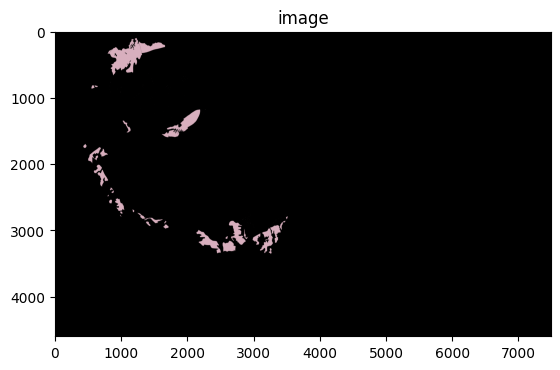

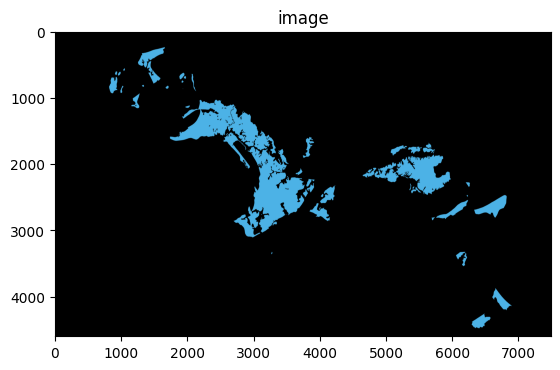

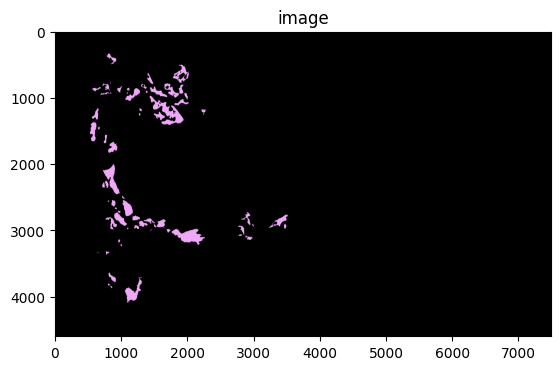

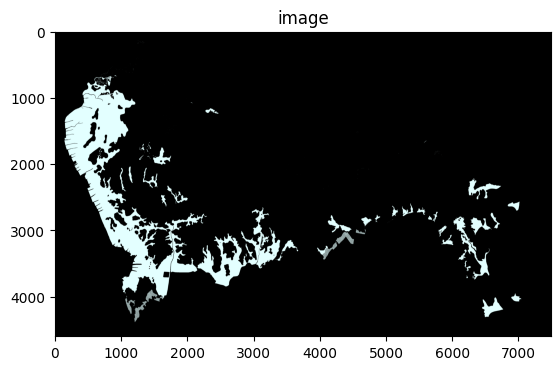

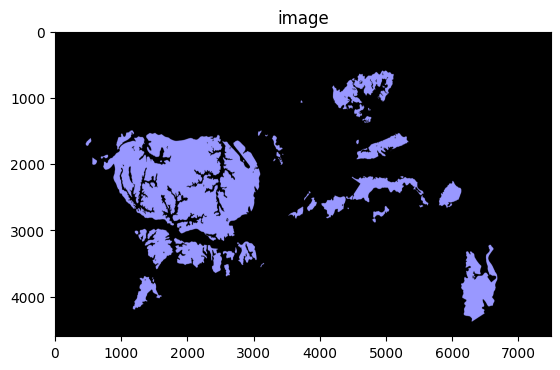

...

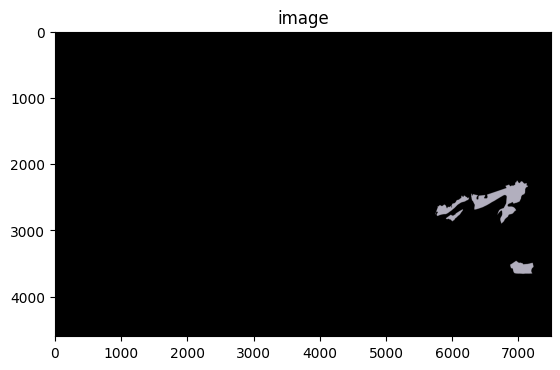

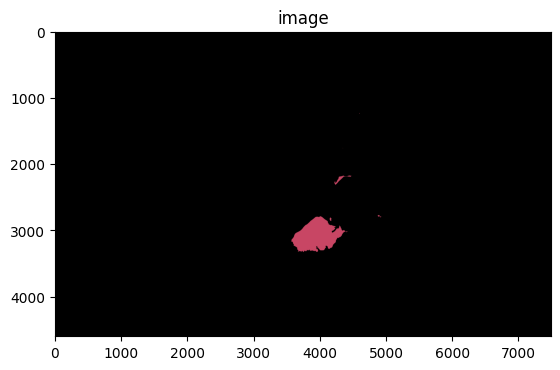

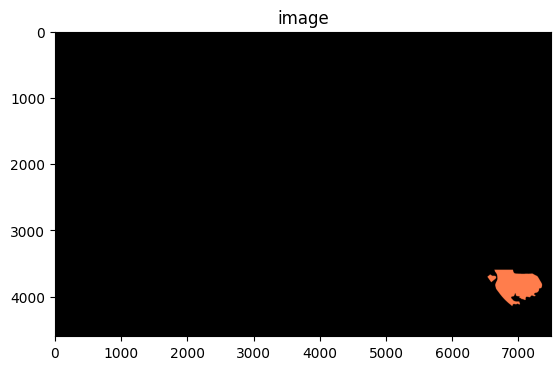

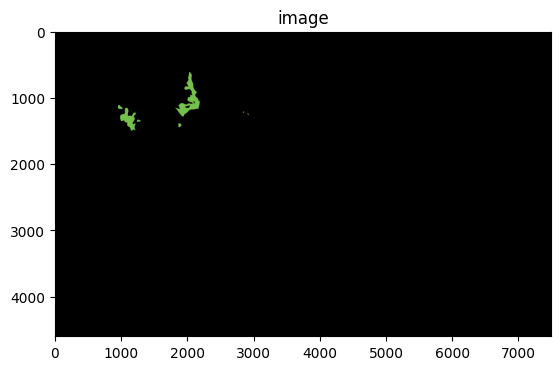

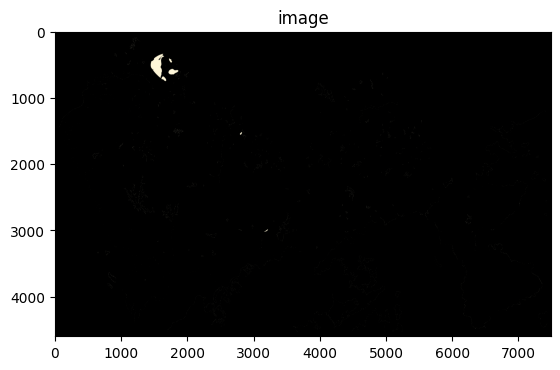

In [ ]:
dzt_mask = []
imgg = new_mask_all
for color in colors:
  dzt_mask.append(get_mask(imgg, color))

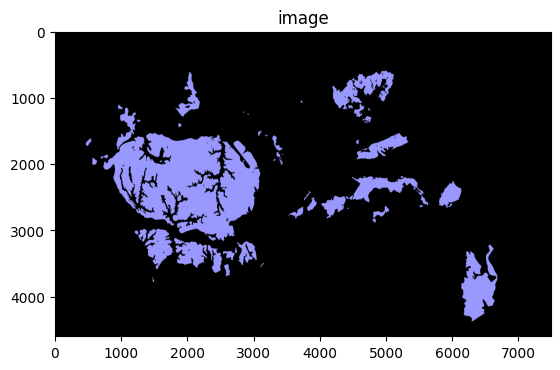

In [ ]:
show_img(dzt_mask[5])

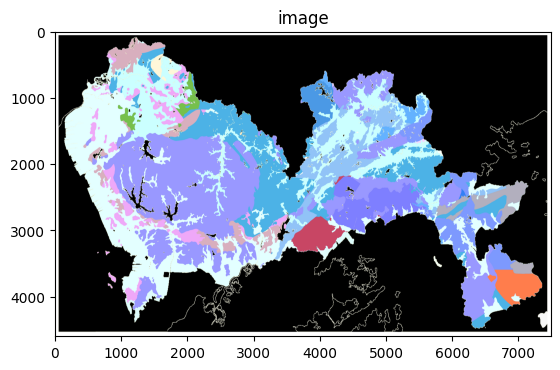

In [ ]:
# raw_array = [154, 126, 255]
# threshold = 5
# min_array = [em - threshold for em in raw_array]
# max_array = [em + threshold for em in raw_array]
# change_pixels(new_mask_all, min_array, max_array, [153, 152, 255])
# show_img(new_mask_all)

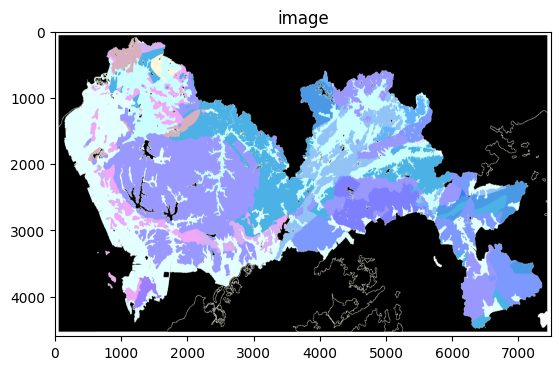

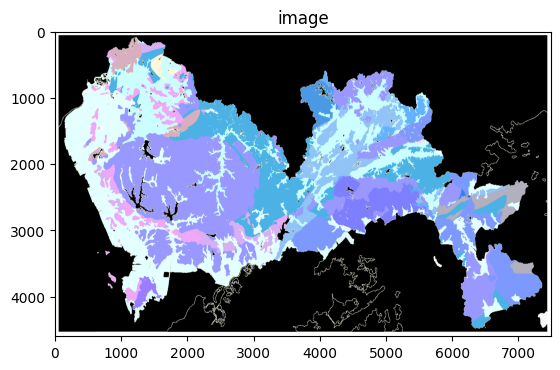

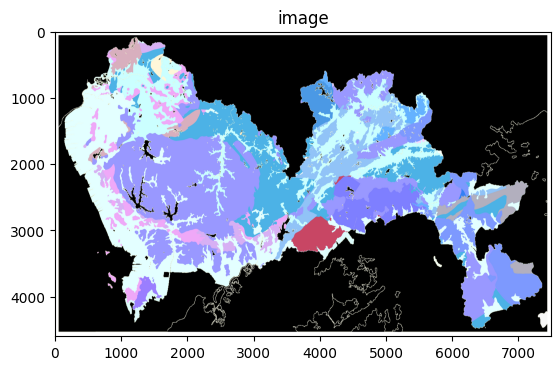

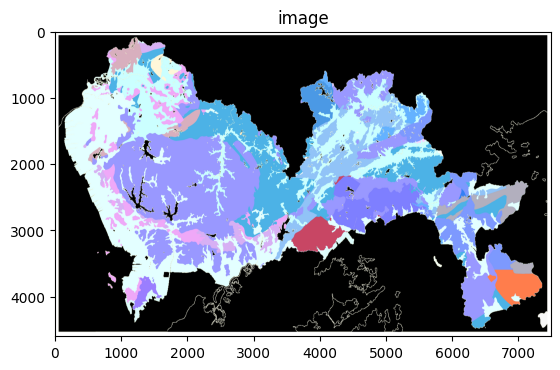

In [ ]:
import copy


mid_mask = copy.deepcopy(image)


raw_array = [ 75, 153, 229]
threshold = 5
min_array = [em - threshold for em in raw_array]
max_array = [em + threshold for em in raw_array]
show_img(mid_mask)
change_pixels(mid_mask[2000:], min_array, max_array, (178, 175, 190))
show_img(mid_mask)
raw_array = [125, 153, 254]
threshold = 5
min_array = [em - threshold for em in raw_array]
max_array = [em + threshold for em in raw_array]
change_pixels(mid_mask[:3600, :5000], min_array, max_array, (200,  70, 100))
show_img(mid_mask)
change_pixels(mid_mask[3600:, 5000:], min_array, max_array, (255, 125,  76))
show_img(mid_mask)

In [ ]:
new_mask_all = copy.deepcopy(mid_mask)
for raw_array in colors:
  threshold = 5
  min_array = [em - threshold for em in raw_array]
  max_array = [em + threshold for em in raw_array]
  change_pixels(new_mask_all, min_array, max_array, raw_array)

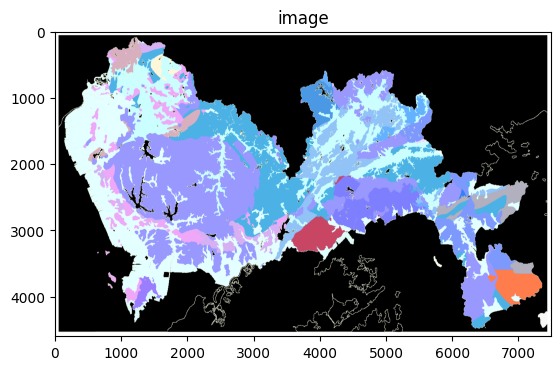

In [ ]:
show_img(new_mask_all)

In [ ]:
root_path = "drive/MyDrive/地层向量化"
cv2.imwrite(os.path.join(root_path, 'sz-dzt.jpg'), new_mask_all)

True

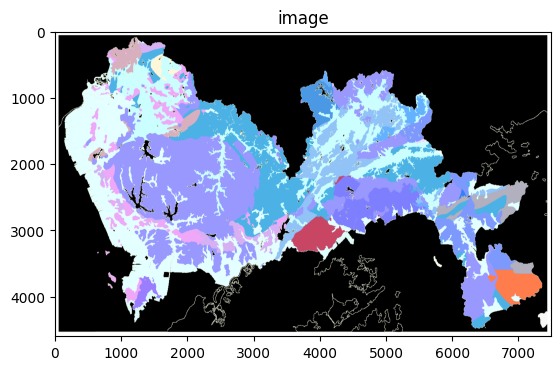

In [ ]:
show_img(new_bg_mask)

In [ ]:
def merge_img(image1, image2):
  # 设置混合权重
  alpha = 1  # 第一幅图像的权重
  beta = 1   # 第二幅图像的权重
  gamma = 0.0  # 亮度调整参数
  # 将两幅图像加权叠加
  result = cv2.addWeighted(image1, alpha, image2, beta, gamma)
  show_img(result)
  return result

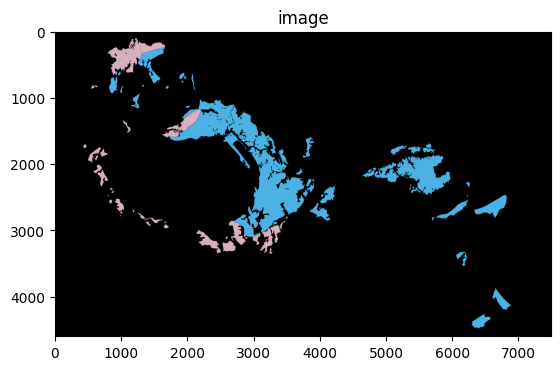

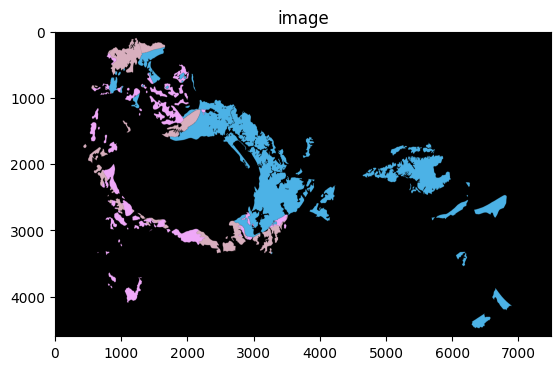

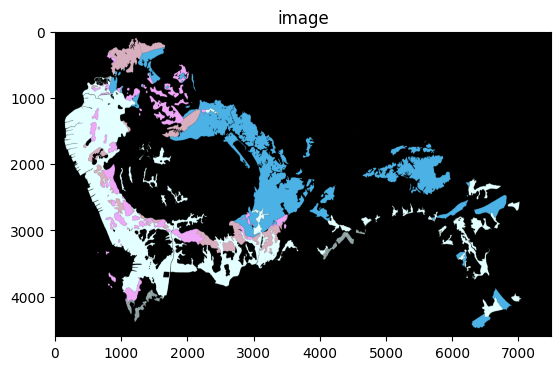

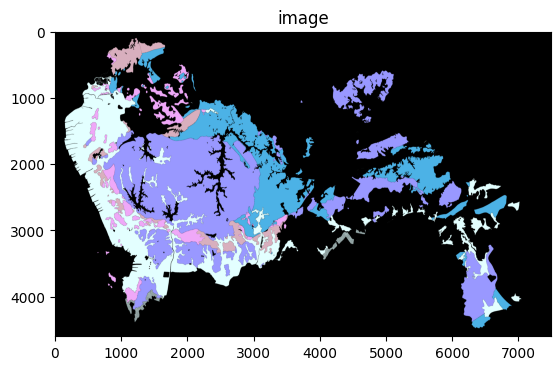

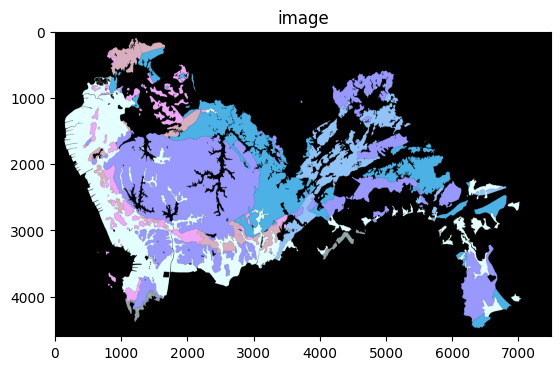

...

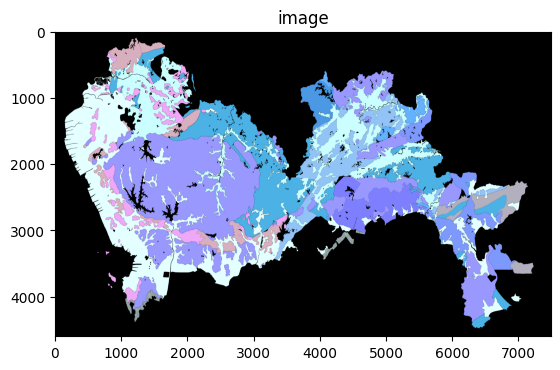

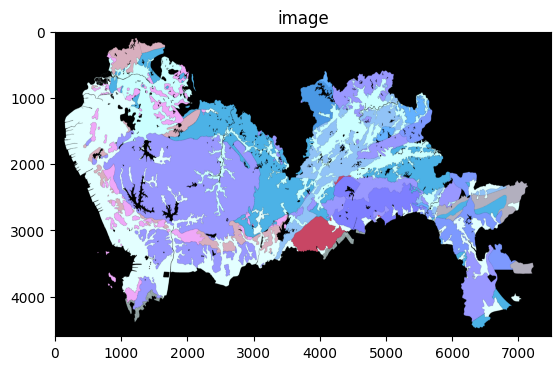

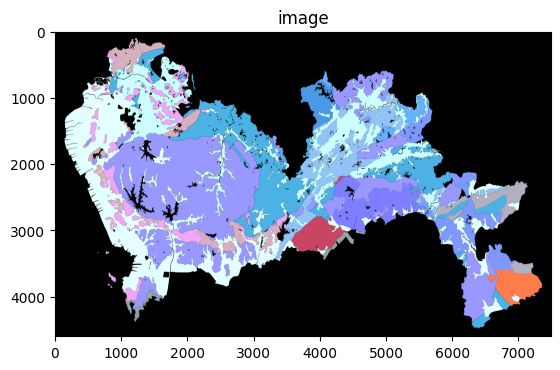

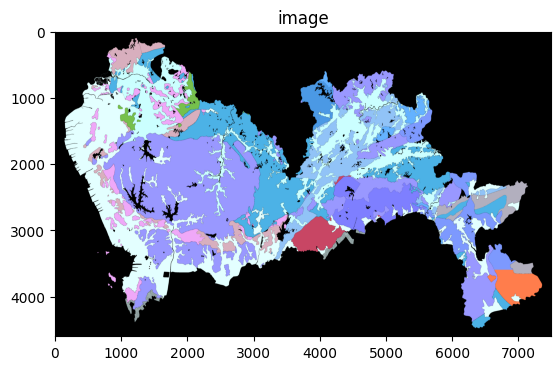

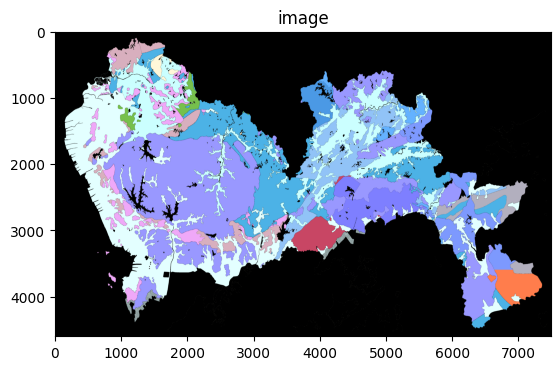

In [ ]:
result_mask = dzt_mask[0]
for em_mask in dzt_mask[1:]:
  result_mask = merge_img(result_mask, em_mask)

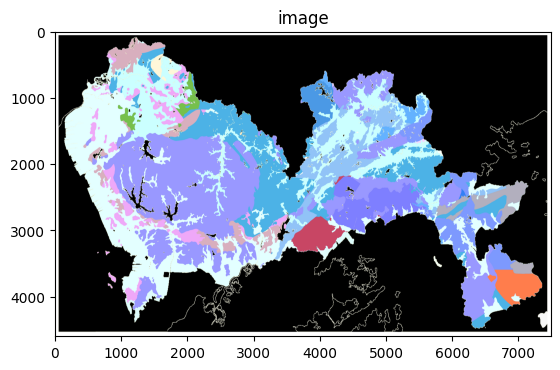

In [ ]:
show_img(new_mask_all)

In [ ]:
save_path = "drive/MyDrive/layers"
import os

# 判断文件夹是否存在
if not os.path.exists(save_path):
    # 创建文件夹
    os.makedirs(save_path)
    print("文件夹已创建！")
else:
    print("文件夹已存在！")
for img, color, name in zip(dzt_mask, colors, dzt_dc):
  img_path = f"{color[0]}-{color[1]}-{color[2]}-{name}.jpg"
  cv2.imwrite(os.path.join(save_path, img_path), img)

文件夹已存在！


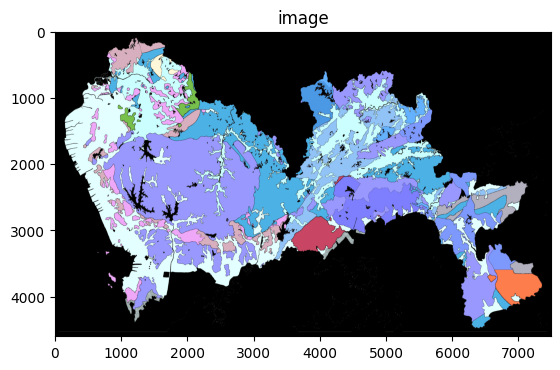

In [ ]:
root_path = "drive/MyDrive/地层向量化"
img = cv2.imread(os.path.join(root_path, "sz-dzt.jpg"))
show_img(img)

In [ ]:
colors = [
    [216, 175, 190],
    [ 76, 178, 230],
    [239, 168, 248],
    [227, 255, 255],
    [153, 152, 255],
    [145, 195, 247],
    [ 75, 153, 229],
    [126, 127, 255],
    [125, 153, 254],
    [203, 255, 255],
    [100, 178, 255],
    [178, 175, 190],
    [200,  70, 100],
    [255, 125,  76],
    [118, 192,  76],
    [255, 247, 217]
]
import numpy as np
# colors = [np.array(em) for em in colors]
dzt_dc = [
    "Z1d",
    "J1-2t",
    "O1",
    "Qg",
    "K1b1",
    "C1c1+C1c2",
    "C1ds",
    "J1a3",
    "J1b3",
    "Qdw",
    "k2E1d",
    "D3c^",
    "J2-3y",
    "J3k1n",
    "K1c1",
    "J1gy",
    ]


In [ ]:
import cv2
import numpy as np

# 读取图像
image = img
def statistics_colors(image):
  # 将图像转换为RGB颜色空间
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # 获取图像尺寸
  height, width, _ = image.shape

  # 创建一个集合来存储所有颜色
  colors = set()

  # 遍历图像的每个像素
  for row in range(height):
      for col in range(width):
          # 获取当前像素的颜色值
          pixel_color = tuple(image_rgb[row, col])

          # 将颜色值添加到集合中
          colors.add(pixel_color)

  # 输出统计结果
  print(f"图像中的不同颜色数量: {len(colors)}")
  return colors

def change_pixels(image, min_pixels, max_pixels, new_color):
  # 定义要替换的颜色范围
  lower_color = np.array(min_pixels)  # 要替换的颜色的下界（B, G, R）
  upper_color = np.array(max_pixels)  # 要替换的颜色的上界（B, G, R）

  # 创建掩膜，将指定颜色区域设为白色，其他区域设为黑色
  mask = cv2.inRange(image, lower_color, upper_color)

  # 将指定颜色区域替换为新的颜色
  image[mask != 0] = new_color

def merge_img(image1, image2):
  # 设置混合权重
  alpha = 1  # 第一幅图像的权重
  beta = 1   # 第二幅图像的权重
  gamma = 0.0  # 亮度调整参数
  # 将两幅图像加权叠加
  result = cv2.addWeighted(image1, alpha, image2, beta, gamma)
  show_img(result)
  return result

In [ ]:
new_mask_all = copy.deepcopy(img)
for inx, raw_array in enumerate(colors):
  print(f"opreating No.{inx}")
  threshold = 5
  min_array = [em - threshold for em in raw_array]
  max_array = [em + threshold for em in raw_array]
  change_pixels(new_mask_all, min_array, max_array, raw_array)

opreating No.0
opreating No.1
opreating No.2
opreating No.3
opreating No.4
opreating No.5
opreating No.6
opreating No.7
opreating No.8
opreating No.9
opreating No.10
opreating No.11
opreating No.12
opreating No.13
opreating No.14
opreating No.15


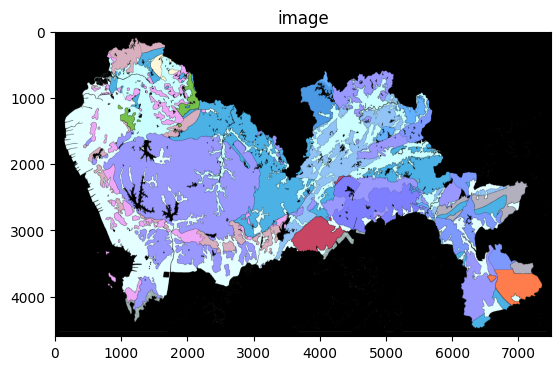

In [ ]:
show_img(new_mask_all)

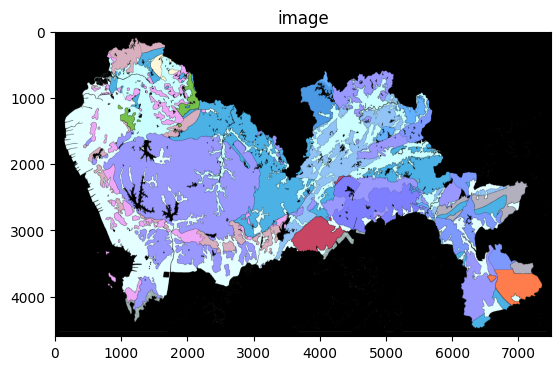

In [ ]:
import numpy as np

# 示例三维数组
image = new_mask_all

# 特定的三元组值
specific_values = colors

# 创建一个布尔类型的掩码数组
mask = np.logical_or.reduce([np.all(image == value, axis=2) for value in specific_values])

# 将除特定值外的其余值改为(0, 0, 0)
image[~mask] = (0, 0, 0)

# 输出结果
show_img(image)

In [ ]:
statistics_colors(img)

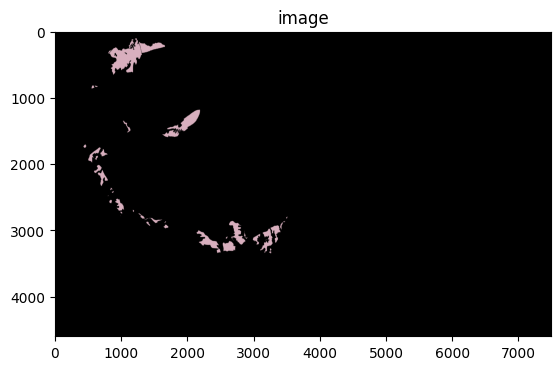

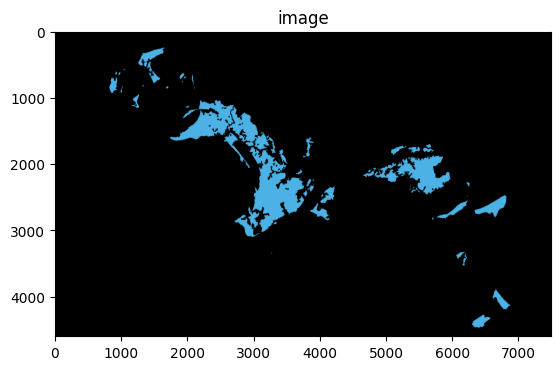

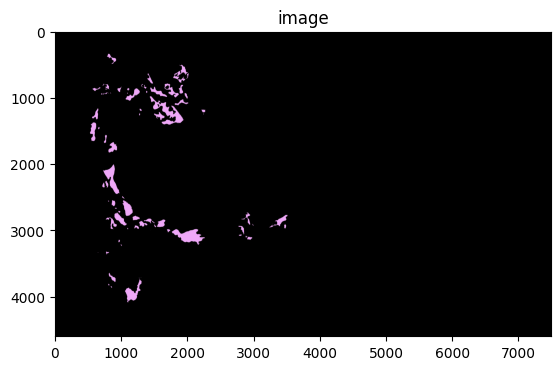

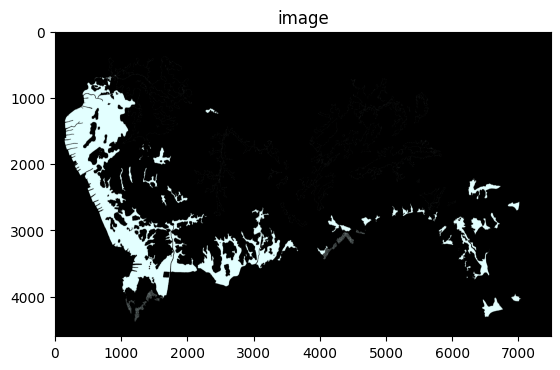

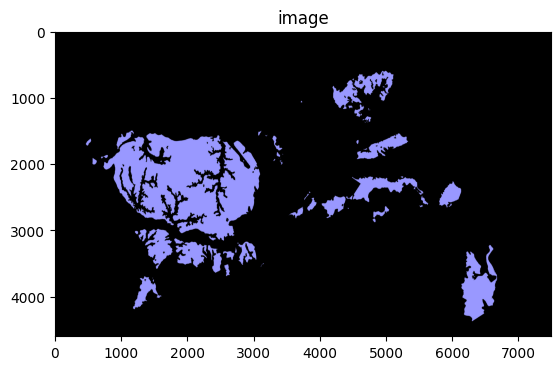

...

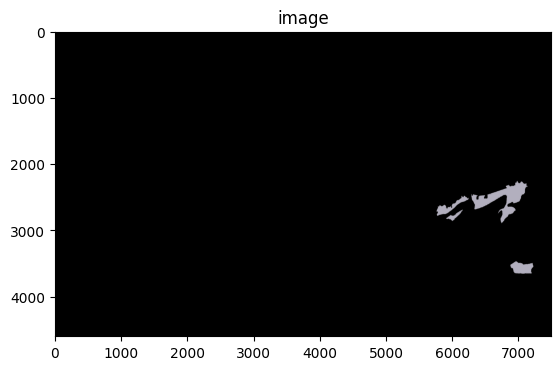

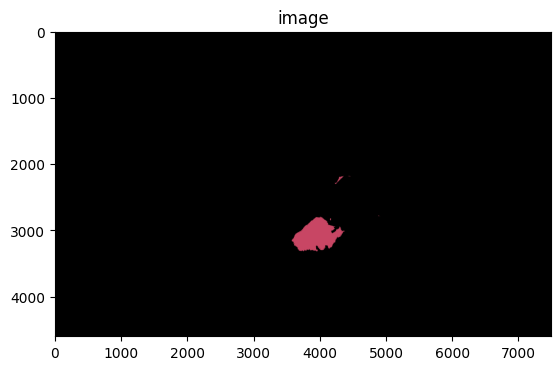

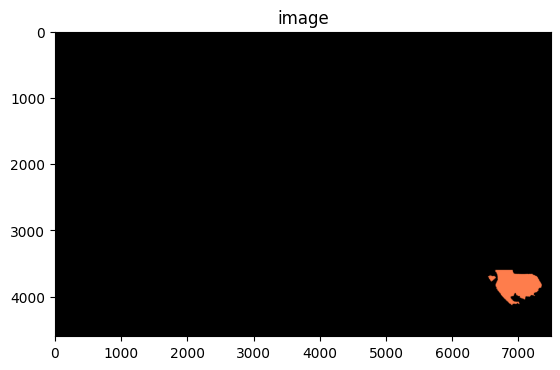

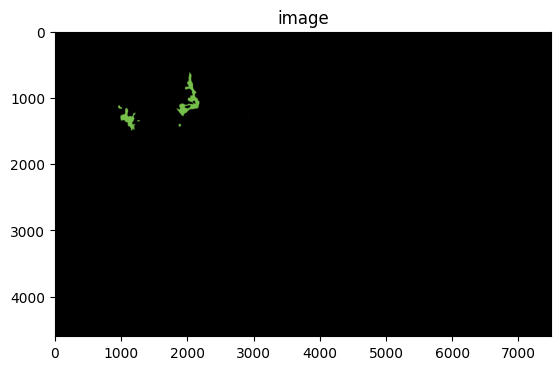

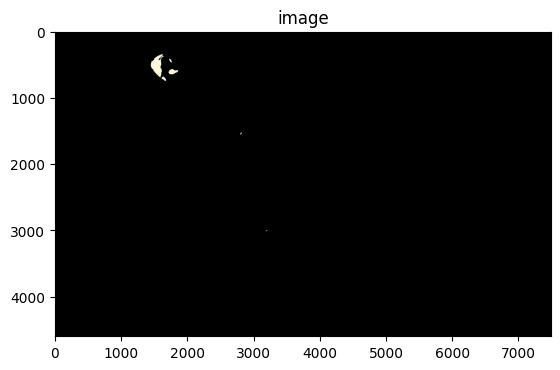

In [ ]:
dzt_mask = []
imgg = new_mask_all
for color in colors:
  dzt_mask.append(get_mask(img, color))

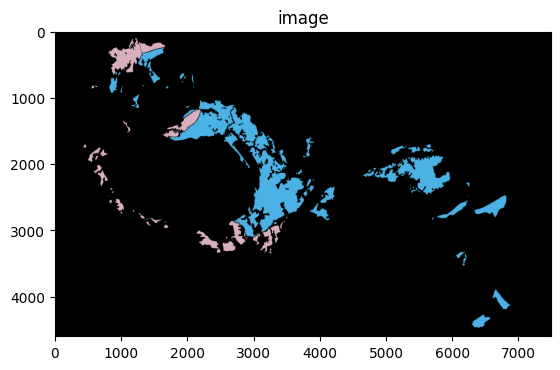

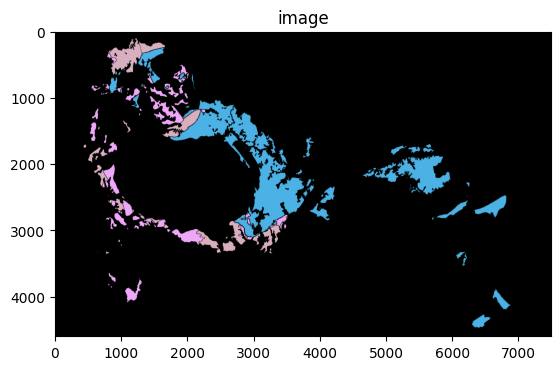

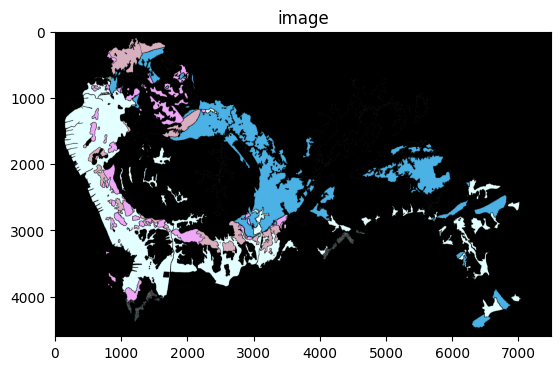

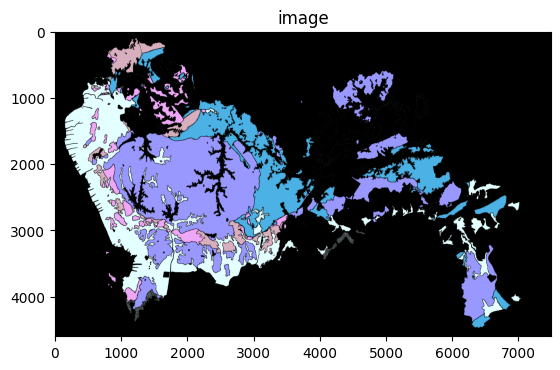

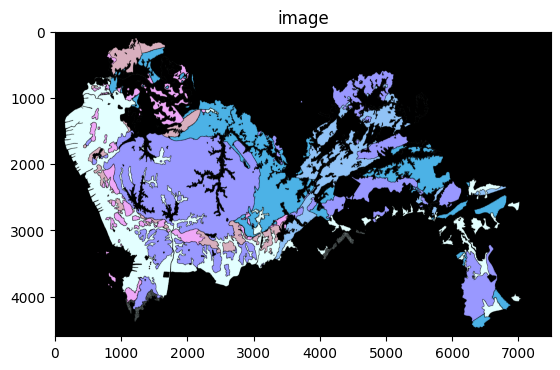

...

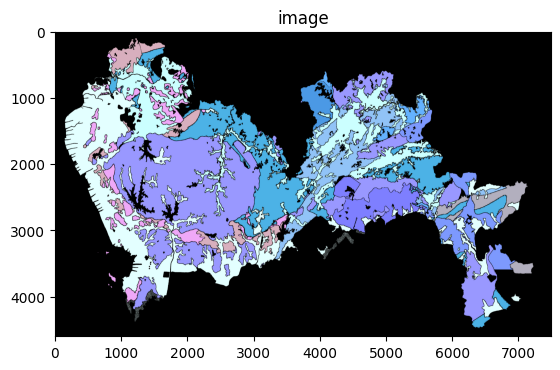

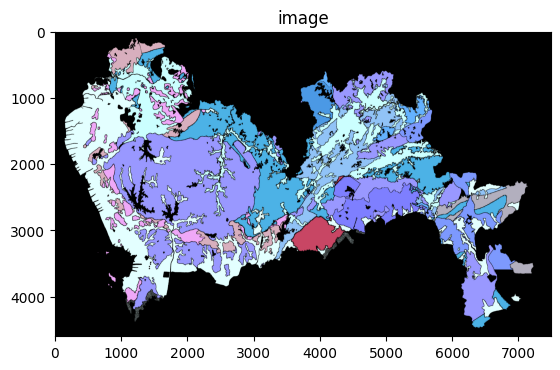

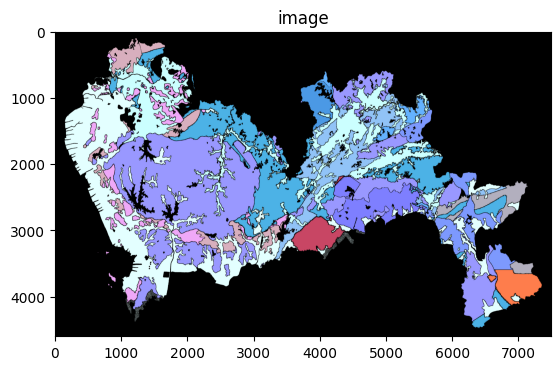

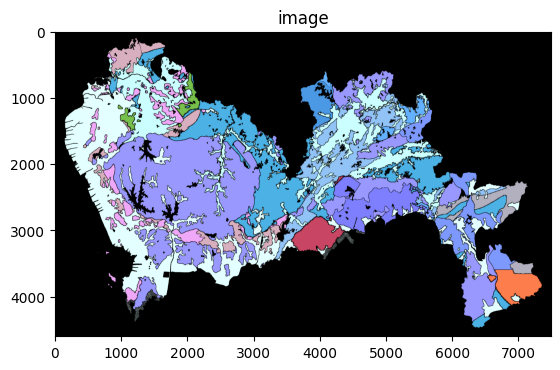

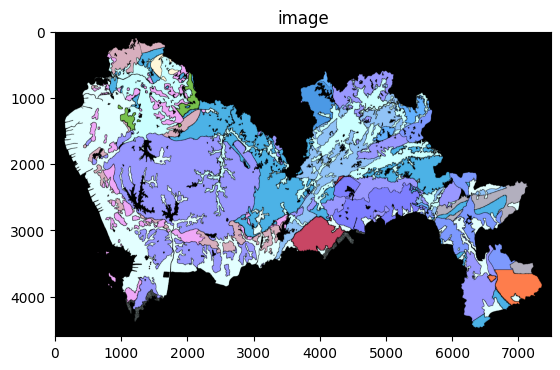

In [ ]:
result_mask = dzt_mask[0]
for em_mask in dzt_mask[1:]:
  result_mask = merge_img(result_mask, em_mask)

In [ ]:
root_path = "drive/MyDrive/地层向量化"
cv2.imwrite(os.path.join(root_path, 'sz-dzt.jpg'), image)

True

# 裁剪的数据对应相应的地层

In [ ]:
import os
import json
import numpy as np


window_size = 48
patch_size = 16
patch_num = 3
half = window_size / 2
data_json_path = "drive/MyDrive/json-files/data.json"

with open(data_json_path, "r") as f:
  data = json.load(f)
with open("drive/MyDrive/地层向量化/深圳市地层向量化.json", 'r') as f:
  dc_vector = json.load(f)

colors = [[216, 175, 190],[ 76, 178, 230],[239, 168, 248],[227, 255, 255],[153, 152, 255],[145, 195, 247],[ 75, 153, 229],[126, 127, 255],[125, 153, 254],[203, 255, 255],[100, 178, 255],[178, 175, 190],[200,  70, 100],[255, 125,  76],[118, 192,  76],[255, 247, 217],[0, 0, 0]]
dzt_dc = ["Z1d","J1-2t","O1","Qg","K1b1","C1c1","C1ds","J1a3","J1b3","Qdw","k2E1d","D3c^","J2-3y","J3k1n","K1c1","J1gy","NAN"]

color2dc = dict()
for color, dc in zip(colors, dzt_dc):
  vec = dc_vector.get(dc, {"vec": np.zeros(768)})['vec']
  vec = [float(i) for i in vec]
  color2dc[f"{color[0]}-{color[1]}-{color[2]}"] = vec
# # 保存
# with open("drive/MyDrive/json-files/color2dc.json", "w") as f:
#     json.dump(color2dc, f)

def statistics_colors(image):
  # 将图像转换为RGB颜色空间
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # 获取图像尺寸
  height, width, _ = image.shape

  # 创建一个集合来存储所有颜色
  colors = set()

  # 遍历图像的每个像素
  for row in range(height):
      for col in range(width):
          # 获取当前像素的颜色值
          pixel_color = tuple(image_rgb[row, col])

          # 将颜色值添加到集合中
          colors.add(pixel_color)

  # 输出统计结果
  print(f"图像中的不同颜色数量: {len(colors)}")
  return colors

def change_pixels(image, min_pixels, max_pixels, new_color):
  # 定义要替换的颜色范围
  lower_color = np.array(min_pixels)  # 要替换的颜色的下界（B, G, R）
  upper_color = np.array(max_pixels)  # 要替换的颜色的上界（B, G, R）

  # 创建掩膜，将指定颜色区域设为白色，其他区域设为黑色
  mask = cv2.inRange(image, lower_color, upper_color)

  # 将指定颜色区域替换为新的颜色
  image[mask != 0] = new_color

In [ ]:
def Color_unity(img, colors):
  import copy

  image = copy.deepcopy(img)
  for inx, raw_array in enumerate(colors):
    print(f"opreating No.{inx}")
    threshold = 5
    min_array = [em - threshold for em in raw_array]
    max_array = [em + threshold for em in raw_array]
    change_pixels(image, min_array, max_array, raw_array)
  # 特定的三元组值
  specific_values = colors

  # 创建一个布尔类型的掩码数组
  mask = np.logical_or.reduce([np.all(image == value, axis=2) for value in specific_values])

  # 将除特定值外的其余值改为(0, 0, 0)
  image[~mask] = (0, 0, 0)

  statistics_colors(image)
  # 输出结果
  return image

In [ ]:
root_path = "drive/MyDrive/地层向量化"
img = cv2.imread(os.path.join(root_path, "sz-dzt.jpg"))
dzt_image = Color_unity(img, colors)
figure_supplement = np.zeros((569, dzt_image.shape[1], 3), dtype=np.uint8)
dzt_image = cv2.vconcat([dzt_image, figure_supplement])

opreating No.0
opreating No.1
opreating No.2
opreating No.3
opreating No.4
opreating No.5
opreating No.6
opreating No.7
opreating No.8
opreating No.9
opreating No.10
opreating No.11
opreating No.12
opreating No.13
opreating No.14
opreating No.15
opreating No.16
图像中的不同颜色数量: 17


In [ ]:
new_data = []
for inx, point in enumerate(data):
  print(f"Processing {inx}st sample")
  data_path = point['data_path']
  coo = [int(i) for i in data_path.replace(".txt", "").split("-")]
  sub_image = dzt_image[coo[0] + patch_size: coo[0] + 2 * patch_size, coo[1] + patch_size: coo[1] + 2 * patch_size]
  # show_img(sub_image)
  colors = statistics_colors(sub_image)
  colors = [f"{em[2]}-{em[1]}-{em[0]}" for em in colors]
  if len(colors) == 1:
    point["vec"] = color2dc[colors[0]]
  else:
    num = -1 if '0-0-0' in colors else 0
    num += len(colors)
    vec = np.zeros(768)
    for color in colors:
      vec += np.array(color2dc[color])
    vec /= num
    vec = [round(i, 6) for i in vec.tolist()]
    point["vec"] = vec
  new_data.append(point)

流式输出内容被截断，只能显示最后 5000 行内容。
Processing 66691st sample
图像中的不同颜色数量: 2
Processing 66692st sample
图像中的不同颜色数量: 1
Processing 66693st sample
图像中的不同颜色数量: 1
Processing 66694st sample
图像中的不同颜色数量: 1
Processing 66695st sample
图像中的不同颜色数量: 1
Processing 66696st sample
图像中的不同颜色数量: 1
Processing 66697st sample
图像中的不同颜色数量: 1
Processing 66698st sample
图像中的不同颜色数量: 1
Processing 66699st sample
图像中的不同颜色数量: 1
Processing 66700st sample
图像中的不同颜色数量: 1
Processing 66701st sample
图像中的不同颜色数量: 1
Processing 66702st sample
图像中的不同颜色数量: 1
Processing 66703st sample
图像中的不同颜色数量: 1
Processing 66704st sample
图像中的不同颜色数量: 1
Processing 66705st sample
图像中的不同颜色数量: 1
Processing 66706st sample
图像中的不同颜色数量: 1
Processing 66707st sample
图像中的不同颜色数量: 1
Processing 66708st sample
图像中的不同颜色数量: 1
Processing 66709st sample
图像中的不同颜色数量: 1
Processing 66710st sample
图像中的不同颜色数量: 1
Processing 66711st sample
图像中的不同颜色数量: 1
Processing 66712st sample
图像中的不同颜色数量: 1
Processing 66713st sample
图像中的不同颜色数量: 1
Processing 66714st sample
图像中的不同颜色数量: 1
Processing 66

In [ ]:
with open("drive/MyDrive/json-files/data_with_dc_vec.json", "w") as f:
    json.dump(new_data, f)

In [ ]:
with open("drive/MyDrive/json-files/data_with_dc_vec.json", "r") as f:
    test_data = json.load(f)

In [ ]:
# show_img(result)
# root_path = "drive/MyDrive/地层向量化"
# cv2.imwrite(os.path.join(root_path, 'dzt-full-size.jpg'), result)
new_data[0]

{'coo': [1, 71],
 'data_path': '16-1136.txt',
 'vec': [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  

(4600, 7490, 3)

# 正负样本裁剪

In [ ]:
import numpy as np
import cv2
import os


X = 7490
Y = 5169
x_resolution = .1171000000000012
y_resolution = -.09005999999999978
x_start = 113.75143448
y_start = 22.86179216
geological_disaster_path = "drive/MyDrive/地质灾害点.txt"
with open(geological_disaster_path, 'r') as f:
  lines = f.readlines()
geological_disasters = []
for line in lines:
  geological_disasters.append([float(i) for i in line.strip().split()])

In [ ]:
geological_disasters_realtive_coordinates = []
for coo in geological_disasters:
  geological_disasters_realtive_coordinates.append([int(1000*(coo[0] - x_start)/x_resolution), int(1000*(coo[1] - y_start)/y_resolution)])

In [ ]:
import random


def is_array_in_nested_array(arr, nested_arr):
    for sub_arr in nested_arr:
        if all(item in sub_arr for item in arr):
            return True
    return False


height = Y
width = X
image = np.zeros((height, width, 3), dtype=np.uint8)
train_geological_disasters_samples = random.sample(geological_disasters_realtive_coordinates, 305)
for coo in geological_disasters_realtive_coordinates:
  radius = 9  # 点的半径
  color = (0, 0, 255) if  is_array_in_nested_array(coo, train_geological_disasters_samples) else (0, 255, 0)
  thickness = -1  # 填充点
  x = coo[0]  # x坐标
  y = coo[1]  # y坐标
  cv2.circle(image, (x, y), radius, color, thickness)
show_img(image)

NameError: name 'show_img' is not defined

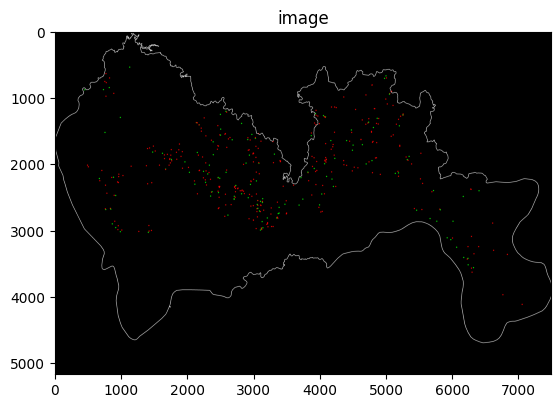

In [ ]:
file_path = "drive/MyDrive/sz_points.json"
with open(file_path, "r") as f:
  content = json.load(f)
sz_points = content['polygon']
# image = np.zeros((Y, X, 3), dtype=np.uint8)
points = np.array(sz_points)
cv2.polylines(image, [points], isClosed=True, color=(255, 255, 255), thickness=6)
show_img(image)

In [ ]:
import numpy as np

def calculate_distance(point, points):
  point = np.array(point)

  # 一组二维点的坐标
  points = np.array(points)

  # 计算点到每个二维点的距离
  distances = np.linalg.norm(points - point, axis=1)
  return distances

In [ ]:
from shapely.geometry import Point, Polygon


negative_samples = []
polygon = Polygon(sz_points)
i = 0
while i < 870:
  x = random.randint(0, 7490)
  y = random.randint(0, 4600)
  point = Point(x, y)
  is_in = is_array_in_nested_array([x, y], geological_disasters_realtive_coordinates)
  is_keep_away = min(calculate_distance([x, y], geological_disasters_realtive_coordinates)) > 16
  if polygon.contains(point) and not is_in and is_keep_away:
      negative_samples.append([x, y])
      i += 1

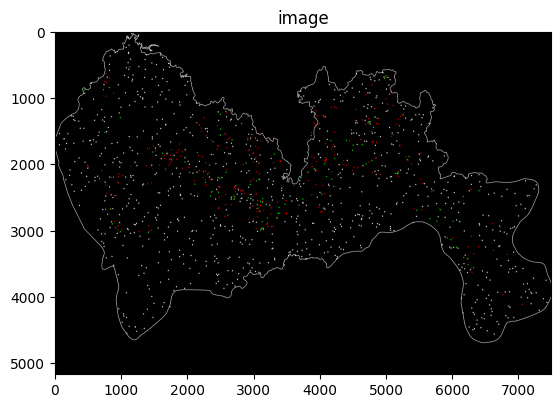

In [ ]:
for coo in negative_samples:
  radius = 9  # 点的半径
  color = (255, 255, 255)
  thickness = -1  # 填充点
  x = coo[0]  # x坐标
  y = coo[1]  # y坐标
  cv2.circle(image, (x, y), radius, color, thickness)
show_img(image)

In [ ]:
train_negative_samples = random.sample(negative_samples,610)

In [ ]:
save_root = "drive/MyDrive/datasets"
data_folder = "train_dataset"
window_size = 48
patch_size = 16
patch_num = 3
half = window_size / 2
X = 7490
Y = 5169

folder_path = os.path.join(save_root, data_folder)
if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print("文件夹已创建")
else:
    print("文件夹已存在")
datasets = []
for i in range(patch_size, raw_data.shape[0] - 2 * patch_size + 1, patch_size):
  for j in range(patch_size, raw_data.shape[1] - 2 * patch_size + 1, patch_size):
    center_y, center_x = i - patch_size + half, j - patch_size + half
    point = Point(center_x, center_y)
    if polygon.contains(point):
      em_data = raw_data[i - patch_size: i + 2 * patch_size, j - patch_size: j + 2 * patch_size]
      em_path = f"{i - patch_size}-{j - patch_size}.txt"
      print(f"save :{em_path}")
      em_json = dict(
          coo = [int(i / 16 - 1), int(j / 16 - 1)],
          data_path = em_path,
      )
      arr_2d = em_data.reshape((-1, em_data.shape[-1]))
      np.savetxt(os.path.join(save_root, data_folder, em_path), arr_2d, fmt='%d')
      datasets.append(em_json)

In [ ]:
import os
import json
json_file = "json-files/train.json"
with open(os.path.join(save_root, json_file), "w") as f:
    json.dump(datasets, f)

In [ ]:
import numpy as np

In [ ]:
array = np.array([[.345454, .023434, .2535, 1.23354, .394334465475985], [.345454, .023434, .2535, 1.23354, .3943]])
np.savetxt("drive/MyDrive/test.txt", array)

array([[0.345454  , 0.023434  , 0.2535    , 1.23354   , 0.39433447],
       [0.345454  , 0.023434  , 0.2535    , 1.23354   , 0.3943    ]])